## Convert LSTM Output to Images
Now I was wondering, what if these "people" were to create art. What type of art would be generated if attention was given to the most basic elements of their sentence? Here I use AttnGAN in order to find out just what they might produce. I have personally wrapped the class within the TextToImage class as loading it became sort of a pain. Any changes which you wish to be done to the network itself can be taken care of by looking into the configs present within [./AttnGAN/miscc/config.py](./AttnGAN/miscc/config.py)

In [ ]:
import torch
from AttnGAN.eval import TextToImage
from tqdm import tqdm

In [2]:
test = TextToImage()

C:\Users\brian\.conda\envs\conda_env\lib\site-packages\torch\nn\modules\rnn.py:46: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


#### Note that this method actually generates more than one image!
The plotExample argument is there for the sake of showing one of the possible generated images.

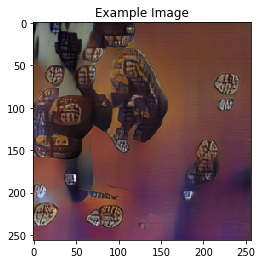

In [12]:
try:
    output = test.generate("Test quote", plotExample=True)
except:
    print("Invalid Quote")

In [6]:
print(len(output))

6


#### Batch Processing
Here we process the output of the LSTM text file and create images based off of them. We choose "quotes" bounded by two quotation marks and that contain a couple words.

In [36]:
IN_TEXT = r'./LSTMOutput.txt'
MIN_WORD_CNT = 4  # Keeps output somewhat regular
MIN_AUTH_CNT = 3   # Keeps author name somewhat regular

texts = []
authors = []
with open(IN_TEXT, 'r') as inFile:
    for line in inFile.readlines():
        split = line.strip().split("\"")
        if len(split)==3 and len(split[1].split(" "))>MIN_WORD_CNT:
            texts.append(split[1])
            authors.append(split[2].lstrip(' -') if len(split[2])>MIN_AUTH_CNT else "Unknown")
            
print("Collected number of reasonable texts: {}".format(len(texts)))

Collected number of reasonable texts: 425


In [40]:
outputImages = []
for quote in tqdm(texts):
    try:
        # choose randomly the last batched image generated
        outputImages.append(test.generate(quote)[-1])
    except:
        print("Failed Quote Generation! Skipping...")
        outputImages.append(None)

 34%|██████████████████████████▉                                                     | 143/425 [02:49<05:36,  1.19s/it]

Failed Quote Generation! Skipping...


 41%|█████████████████████████████████▏                                              | 176/425 [03:26<04:58,  1.20s/it]

Failed Quote Generation! Skipping...


 77%|█████████████████████████████████████████████████████████████▌                  | 327/425 [06:22<01:54,  1.17s/it]

Failed Quote Generation! Skipping...


100%|████████████████████████████████████████████████████████████████████████████████| 425/425 [08:18<00:00,  1.16s/it]


In [42]:
# Pickle the output results for later use if desired
import pickle

PKL_TUPLE_OUTPUT = 'batchedGenImages.pkl'
with open(PKL_TUPLE_OUTPUT, 'wb') as outFile:
    pickle.dump((authors, texts, outputImages), outFile)

## Sentiment Analysis of Text
Furthermore, it can be said that many of these words have some associated sentiment to them. We use sentiment analysis to describe the mood and then apply the style of a known mood to the image to create the finalized piece.

In [1]:
import tensorflow as tf
tf.enable_eager_execution()
import numpy as np
import pickle

In [10]:
# import encoder
class ConstructVocab():
    def __init__(self, sentences):
        self.sentences = sentences
        self.word2idx = {}
        self.idx2word = {}
        self.vocab = set()
        self.create_index()
        
    def create_index(self):
        for s in self.sentences:
            # update with individual tokens
            self.vocab.update(s.split(' '))
            
        # sort the vocab
        self.vocab = sorted(self.vocab)

        # add a padding token with index 0
        self.word2idx['<pad>'] = 0
        
        # word to index mapping
        for index, word in enumerate(self.vocab):
            self.word2idx[word] = index + 1 # +1 because of pad token
        
        # index to word mapping
        for word, index in self.word2idx.items():
            self.idx2word[index] = word
            
TEXT_ENCODER_PATH = './SentimentRNN/textEncoder.pkl'
with open(TEXT_ENCODER_PATH, 'rb') as encoderPath:
    inputs = pickle.load(encoderPath)

# import our data now
PKL_TUPLE_OUTPUT = 'batchedGenImages.pkl'
with open(PKL_TUPLE_OUTPUT, 'rb') as inFile:
    authors, texts, outputImages = pickle.load(inFile)

In [3]:
### define the GRU component
def gru(units):
    if tf.test.is_gpu_available():
        return tf.keras.layers.CuDNNGRU(units, 
                                    return_sequences=True, 
                                    return_state=True, 
                                    recurrent_initializer='glorot_uniform')
    else:
        return tf.keras.layers.GRU(units, 
                               return_sequences=True, 
                               return_state=True, 
                               recurrent_activation='relu', 
                               recurrent_initializer='glorot_uniform')

### Build the model
class EmoGRU(tf.keras.Model):
    def __init__(self, vocab_size, embedding_dim, hidden_units, batch_sz, output_size):
        super(EmoGRU, self).__init__()
        self.batch_sz = batch_sz
        self.hidden_units = hidden_units
        
        # layers
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.dropout = tf.keras.layers.Dropout(0.5)
        self.gru = gru(self.hidden_units)
        self.fc = tf.keras.layers.Dense(output_size)
        
    def call(self, x, hidden):
        x = self.embedding(x) # batch_size X max_len X embedding_dim
        output, state = self.gru(x, initial_state = hidden) #  batch_size X max_len X hidden_units
        out = output[:,-1,:]
        out = self.dropout(out)
        out = self.fc(out) # batch_size X max_len X output_size
        return out, state
    
    def initialize_hidden_state(self):
        return tf.zeros((self.batch_sz, self.hidden_units))

In [4]:
embedding_dim = 256
units = 1024
vocab_inp_size = len(inputs.word2idx)
target_size = 6
BATCH_SIZE = 64

model = EmoGRU(vocab_inp_size, embedding_dim, units, BATCH_SIZE, target_size)

# need input to decide input shape
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

data = pickle.load(open("SentimentRNN/merged_training.pkl", 'rb'))
data["token_size"] = data["text"].apply(lambda x: len(x.split(' ')))
data = data.loc[data['token_size'] < 70].copy()
data = data.sample(n=50000, random_state=1)
inputs = ConstructVocab(data["text"].values.tolist())
input_tensor = [[inputs.word2idx[s] for s in es.split(' ')]  for es in data["text"].values.tolist()]
def max_length(tensor):
    return max(len(t) for t in tensor)
max_length_inp = max_length(input_tensor)
input_tensor = tf.keras.preprocessing.sequence.pad_sequences(input_tensor, 
                                                             maxlen=max_length_inp,
                                                             padding='post')
emotions = list(set(data.emotions.unique()))
num_emotions = len(emotions)
mlb = preprocessing.MultiLabelBinarizer()
data_labels =  [set(emos) & set(emotions) for emos in data[['emotions']].values]
bin_emotions = mlb.fit_transform(data_labels)
target_tensor = np.array(bin_emotions.tolist())
input_tensor_train, _, target_tensor_train, _ = train_test_split(input_tensor, target_tensor, test_size=0.2)
train_dataset = tf.data.Dataset.from_tensor_slices((input_tensor_train, 
                                                    target_tensor_train)).shuffle(len(input_tensor_train))
train_dataset = train_dataset.batch(BATCH_SIZE, drop_remainder=True)
print(print(train_dataset))
hidden = model.initialize_hidden_state()
for (batch, (inp, targ)) in enumerate(train_dataset):
    out, state = model(inp, hidden)
    break

model.load_weights('SentimentRNN/checkpoints/')
model.summary()

<DatasetV1Adapter shapes: ((64, 68), (64, 6)), types: (tf.int32, tf.int32)>
None
Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        multiple                  7042816   
_________________________________________________________________
dropout (Dropout)            multiple                  0         
_________________________________________________________________
cu_dnngru (CuDNNGRU)         multiple                  3938304   
_________________________________________________________________
dense (Dense)                multiple                  6150      
Total params: 10,987,270
Trainable params: 10,987,270
Non-trainable params: 0
_________________________________________________________________


In [39]:
# Process all of our sentences through this network
test_tensor = [[inputs.word2idx.get(s, 0) for s in es.split(' ')] for es in texts]
max_length_inp = max_length(test_tensor)
test_tensor = tf.keras.preprocessing.sequence.pad_sequences(test_tensor, 
                                                             maxlen=max_length_inp,
                                                             padding='post')
test_dataset = tf.data.Dataset.from_tensor_slices((test_tensor))
test_dataset = test_dataset.batch(BATCH_SIZE, drop_remainder=True)

# get predictions
hidden = model.initialize_hidden_state()
all_predictions=[]
for (batch, (inp)) in enumerate(test_dataset):
    predictions,_ = model(inp, hidden)   
    all_predictions.append(predictions)
    
final_predictions = []
for p in all_predictions:
    for sub_p in p:
        final_predictions.append(sub_p)
predictions = [np.argmax(p).item() for p in final_predictions]
emotion_dict = {0: 'anger', 1: 'fear', 2: 'joy', 3: 'love', 4: 'sadness', 5: 'surprise'}
emotionLabels = [emotion_dict[elem] for elem in predictions]

In [45]:
print(emotionLabels)

EMOTION_PACKED_OUT = 'batchedGenImagesMoods.pkl'
with open(EMOTION_PACKED_OUT, 'wb') as outFile:
    pickle.dump((authors, texts, outputImages, emotionLabels), outFile)

['sadness', 'joy', 'joy', 'sadness', 'joy', 'joy', 'joy', 'anger', 'sadness', 'sadness', 'joy', 'sadness', 'anger', 'joy', 'sadness', 'anger', 'joy', 'sadness', 'sadness', 'anger', 'sadness', 'sadness', 'sadness', 'joy', 'joy', 'joy', 'sadness', 'joy', 'joy', 'joy', 'sadness', 'joy', 'joy', 'joy', 'sadness', 'joy', 'sadness', 'joy', 'joy', 'sadness', 'anger', 'sadness', 'joy', 'sadness', 'anger', 'joy', 'joy', 'joy', 'sadness', 'sadness', 'anger', 'sadness', 'joy', 'joy', 'sadness', 'joy', 'joy', 'anger', 'joy', 'joy', 'joy', 'anger', 'sadness', 'joy', 'anger', 'joy', 'joy', 'joy', 'anger', 'joy', 'joy', 'anger', 'joy', 'sadness', 'joy', 'joy', 'joy', 'sadness', 'sadness', 'fear', 'joy', 'joy', 'joy', 'anger', 'joy', 'anger', 'joy', 'joy', 'anger', 'anger', 'anger', 'joy', 'sadness', 'joy', 'love', 'joy', 'joy', 'joy', 'joy', 'joy', 'joy', 'sadness', 'joy', 'joy', 'sadness', 'anger', 'anger', 'anger', 'joy', 'sadness', 'anger', 'joy', 'joy', 'joy', 'love', 'anger', 'anger', 'fear', 'jo

## Mood Style Transfer
Using the above, transfer specific styles into the images. (Most of this was taken from the example code given to us)

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (10,10)
mpl.rcParams['axes.grid'] = False

import numpy as np
from PIL import Image
import time
import functools
import pickle

# TF imports
import tensorflow as tf
import tensorflow.contrib.eager as tfe

from tensorflow.python.keras.preprocessing import image as kp_image
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

tf.enable_eager_execution()
print("Eager execution: {}".format(tf.executing_eagerly()))

Eager execution: True


In [2]:
# Load in previous results
EMOTION_PACKED_OUT = 'batchedGenImagesMoods.pkl'
with open(EMOTION_PACKED_OUT, 'rb') as outFile:
    authors, texts, outputImages, emotionLabels = pickle.load(outFile)

In [3]:
# Displaying Fxns
def load_img(path_to_img):
    max_dim = 512
    img = Image.open(path_to_img)
    long = max(img.size)
    scale = max_dim/long
    img = img.resize((round(img.size[0]*scale), round(img.size[1]*scale)), Image.ANTIALIAS)

    img = kp_image.img_to_array(img)

    # We need to broadcast the image array such that it has a batch dimension 
    img = np.expand_dims(img, axis=0)
    return img

def imshow(img, title=None):
    # Remove the batch dimension
    out = np.squeeze(img, axis=0)
    # Normalize for display 
    out = out.astype('uint8')
    plt.imshow(out)
    if title is not None:
        plt.title(title)
    plt.imshow(out)

In [4]:
def load_and_process_img(path_to_img):
    img = load_img(path_to_img)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img

def deprocess_img(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
    if len(x.shape) != 3:
        raise ValueError("Invalid input to deprocessing image")

    # perform the inverse of the preprocessing step
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]

    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [5]:
# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer we are interested in
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1'
               ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [6]:
# Model Fxns
def get_model():
  """ Creates our model with access to intermediate layers. 
  
  This function will load the VGG19 model and access the intermediate layers. 
  These layers will then be used to create a new model that will take input image
  and return the outputs from these intermediate layers from the VGG model. 
  
  Returns:
    returns a keras model that takes image inputs and outputs the style and 
      content intermediate layers. 
  """
  # Load our model. We load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  # Get output layers corresponding to style and content layers 
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs
  # Build model 
  return models.Model(vgg.input, model_outputs)

def get_content_loss(base_content, target):
  return tf.reduce_mean(tf.square(base_content - target))

def gram_matrix(input_tensor):
  # We make the image channels first 
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)

def get_style_loss(base_style, gram_target):
  """Expects two images of dimension h, w, c"""
  # height, width, num filters of each layer
  # We scale the loss at a given layer by the size of the feature map and the number of filters
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  
  return tf.reduce_mean(tf.square(gram_style - gram_target))# / (4. * (channels ** 2) * (width * height) ** 2)

def get_feature_representations(model, content_path, style_path):
  """Helper function to compute our content and style feature representations.

  This function will simply load and preprocess both the content and style 
  images from their path. Then it will feed them through the network to obtain
  the outputs of the intermediate layers. 
  
  Arguments:
    model: The model that we are using.
    content_path: The path to the content image.
    style_path: The path to the style image
    
  Returns:
    returns the style features and the content features. 
  """
  # Load our images in 
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)
  
  # batch compute content and style features
  style_outputs = model(style_image)
  content_outputs = model(content_image)
  
  
  # Get the style and content feature representations from our model  
  style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
  content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
  return style_features, content_features

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  """This function will compute the loss total loss.
  
  Arguments:
    model: The model that will give us access to the intermediate layers
    loss_weights: The weights of each contribution of each loss function. 
      (style weight, content weight, and total variation weight)
    init_image: Our initial base image. This image is what we are updating with 
      our optimization process. We apply the gradients wrt the loss we are 
      calculating to this image.
    gram_style_features: Precomputed gram matrices corresponding to the 
      defined style layers of interest.
    content_features: Precomputed outputs from defined content layers of 
      interest.
      
  Returns:
    returns the total loss, style loss, content loss, and total variational loss
  """
  style_weight, content_weight = loss_weights
  
  # Feed our init image through our model. This will give us the content and 
  # style representations at our desired layers. Since we're using eager
  # our model is callable just like any other function!
  model_outputs = model(init_image)
  
  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]
  
  style_score = 0
  content_score = 0

  # Accumulate style losses from all layers
  # Here, we equally weight each contribution of each loss layer
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
  # Accumulate content losses from all layers 
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
  
  style_score *= style_weight
  content_score *= content_weight

  # Get total loss
  loss = style_score + content_score 
  return loss, style_score, content_score

def compute_grads(cfg):
  with tf.GradientTape() as tape: 
    all_loss = compute_loss(**cfg)
  # Compute gradients wrt input image
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

In [26]:
# Training Loop
import IPython.display

def run_style_transfer(content_path, 
                       style_path,
                       num_iterations=1000,
                       content_weight=1e3, 
                       style_weight=1e-2): 
  # We don't need to (or want to) train any layers of our model, so we set their
  # trainable to false. 
  model = get_model() 
  for layer in model.layers:
    layer.trainable = False
  
  # Get the style and content feature representations (from our specified intermediate layers) 
  style_features, content_features = get_feature_representations(model, content_path, style_path)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
  # Set initial image
  init_image = load_and_process_img(content_path)
  init_image = tfe.Variable(init_image, dtype=tf.float32)
  # Create our optimizer
  opt = tf.train.AdamOptimizer(learning_rate=5, beta1=0.99, epsilon=1e-1)

  # For displaying intermediate images 
  iter_count = 1
  
  # Store our best result
  best_loss, best_img = float('inf'), None
  
  # Create a nice config 
  loss_weights = (style_weight, content_weight)
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features,
  }
    
  # For displaying
  num_rows = 2
  num_cols = 5
  display_interval = num_iterations/(num_rows*num_cols)
  start_time = time.time()
  global_start = time.time()
  
  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means   
  
  imgs = []
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time() 
    
    if loss < best_loss:
      # Update best loss and best image from total loss. 
      best_loss = loss
      best_img = deprocess_img(init_image.numpy())

    if i % display_interval== 0:
      start_time = time.time()
      
      # Use the .numpy() method to get the concrete numpy array
#       plot_img = init_image.numpy()
#       plot_img = deprocess_img(plot_img)
#       imgs.append(plot_img)
#       IPython.display.clear_output(wait=True)
#       IPython.display.display_png(Image.fromarray(plot_img))
      print('Iteration: {}'.format(i))        
      print('Total loss: {:.4e}, ' 
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
  print('Total time: {:.4f}s'.format(time.time() - global_start))
      
  return best_img, best_loss

In [27]:
def show_results(best_img, content_path, style_path, show_large_final=True):
    plt.figure(figsize=(10, 5))
    content = load_img(content_path) 
    style = load_img(style_path)

    plt.subplot(1, 2, 1)
    imshow(content, 'Content Image')

    plt.subplot(1, 2, 2)
    imshow(style, 'Style Image')

    if show_large_final: 
        plt.figure(figsize=(10, 10))

        plt.imshow(best_img)
        plt.title('Output Image')
        plt.show()

#### We use the following style images...

{'anger': './StyleTransferDefs/baconPope.jpg', 'fear': './StyleTransferDefs/munchScream.jpg', 'joy': './StyleTransferDefs/matisseDance.jpg', 'love': './StyleTransferDefs/KlimtKiss.jpg', 'sadness': './StyleTransferDefs/picassoBlues.jpg', 'surprise': './StyleTransferDefs/kandinskyBird.jpg'}


Text(0.5, 1.0, 'Surprise')

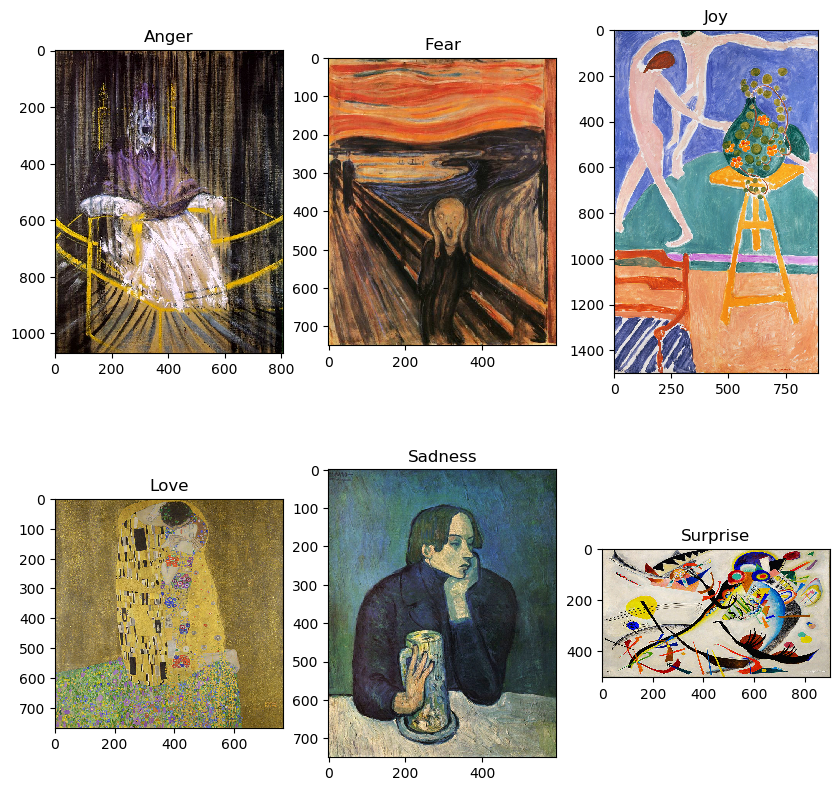

In [28]:
emotion_dict = {0: 'anger', 1: 'fear', 2: 'joy', 3: 'love', 4: 'sadness', 5: 'surprise'}
images_list = ['baconPope.jpg', 'munchScream.jpg', 'matisseDance.jpg', 'KlimtKiss.jpg', 'picassoBlues.jpg', 'kandinskyBird.jpg']
images_list = ['./StyleTransferDefs/'+im for im in images_list]
images_dict = {emotion:image for (emotion, image) in zip(emotion_dict.values(), images_list)}
print(images_dict)

fig, ax = plt.subplots(2, 3, dpi=100, figsize=(10,10))
plt.subplot(ax[0,0])
plt.imshow(plt.imread(images_list[0]))
plt.title("Anger")
plt.subplot(ax[0,1])
plt.imshow(plt.imread(images_list[1]))
plt.title("Fear")
plt.subplot(ax[0,2])
plt.imshow(plt.imread(images_list[2]))
plt.title("Joy")
plt.subplot(ax[1,0])
plt.imshow(plt.imread(images_list[3]))
plt.title("Love")
plt.subplot(ax[1,1])
plt.imshow(plt.imread(images_list[4]))
plt.title("Sadness")
plt.subplot(ax[1,2])
plt.imshow(plt.imread(images_list[5]))
plt.title("Surprise")

#### And the following is where the output images are generated...

In [32]:
from tqdm import tqdm
import random

# SET NUMBER OF IMAGES DESIRED HERE
MAX_IMS = 20

# this takes care of the style transferring between images
transferredIms = list()
imgInds = random.sample(range(len(outputImages)), k=MAX_IMS)
for ind in tqdm(imgInds):
    if image is None:
        print("Encountered non-image... Skipping...")
    else:
        plt.imsave('./temp.jpg', outputImages[ind])
        curMoodPath = images_dict[emotionLabels[ind]]
        best_res,_ = run_style_transfer('./temp.jpg', curMoodPath)
        transferredIms.append(best_res)
        
# Remove temporary image
from os import remove
remove("./temp.jpg")







  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Iteration: 0
Total loss: 5.3407e+08, style loss: 5.3407e+08, content loss: 0.0000e+00, time: 0.0020s
Iteration: 100
Total loss: 1.5120e+07, style loss: 1.3424e+07, content loss: 1.6963e+06, time: 0.0015s
Iteration: 200
Total loss: 6.1941e+06, style loss: 4.8288e+06, content loss: 1.3653e+06, time: 0.0020s
Iteration: 300
Total loss: 3.4790e+06, style loss: 2.4012e+06, content loss: 1.0779e+06, time: 0.0020s
Iteration: 400
Total loss: 2.3378e+06, style loss: 1.4613e+06, content loss: 8.7650e+05, time: 0.0015s
Iteration: 500
Total loss: 1.7698e+06, style loss: 1.0306e+06, content loss: 7.3923e+05, time: 0.0020s
Iteration: 600
Total loss: 1.4559e+06, style loss: 8.0361e+05, content loss: 6.5227e+05, time: 0.0015s
Iteration: 700
Total loss: 1.2651e+06, style loss: 6.7205e+05, content loss: 5.9307e+05, time: 0.0015s
Iteration: 800
Total loss: 1.1389e+06, style loss: 5.8761e+05, content loss: 5.5132e+05, time: 0.0020s
Iteration: 900
Total loss: 1.0498e+06, style loss: 5.2951e+05, content loss







  5%|████▏                                                                              | 1/20 [01:31<29:01, 91.68s/it]

Iteration: 0
Total loss: 4.5181e+08, style loss: 4.5181e+08, content loss: 0.0000e+00, time: 0.0020s
Iteration: 100
Total loss: 1.2732e+07, style loss: 1.0846e+07, content loss: 1.8853e+06, time: 0.0015s
Iteration: 200
Total loss: 5.3762e+06, style loss: 3.8450e+06, content loss: 1.5312e+06, time: 0.0015s
Iteration: 300
Total loss: 3.1168e+06, style loss: 1.8970e+06, content loss: 1.2197e+06, time: 0.0020s
Iteration: 400
Total loss: 2.1903e+06, style loss: 1.1791e+06, content loss: 1.0112e+06, time: 0.0015s
Iteration: 500
Total loss: 1.7345e+06, style loss: 8.6006e+05, content loss: 8.7442e+05, time: 0.0020s
Iteration: 600
Total loss: 1.4797e+06, style loss: 6.9242e+05, content loss: 7.8723e+05, time: 0.0020s
Iteration: 700
Total loss: 1.3226e+06, style loss: 5.9482e+05, content loss: 7.2776e+05, time: 0.0015s
Iteration: 800
Total loss: 1.2164e+06, style loss: 5.3195e+05, content loss: 6.8442e+05, time: 0.0015s
Iteration: 900
Total loss: 1.1389e+06, style loss: 4.8697e+05, content loss







 10%|████████▎                                                                          | 2/20 [03:05<27:41, 92.31s/it]

Iteration: 0
Total loss: 5.0631e+08, style loss: 5.0631e+08, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 1.3263e+07, style loss: 1.1684e+07, content loss: 1.5785e+06, time: 0.0015s
Iteration: 200
Total loss: 5.4591e+06, style loss: 4.2291e+06, content loss: 1.2300e+06, time: 0.0020s
Iteration: 300
Total loss: 3.0180e+06, style loss: 2.0492e+06, content loss: 9.6877e+05, time: 0.0020s
Iteration: 400
Total loss: 2.0254e+06, style loss: 1.2216e+06, content loss: 8.0384e+05, time: 0.0020s
Iteration: 500
Total loss: 1.5545e+06, style loss: 8.6254e+05, content loss: 6.9196e+05, time: 0.0020s
Iteration: 600
Total loss: 1.2991e+06, style loss: 6.7985e+05, content loss: 6.1928e+05, time: 0.0015s
Iteration: 700
Total loss: 1.1453e+06, style loss: 5.7539e+05, content loss: 5.6992e+05, time: 0.0020s
Iteration: 800
Total loss: 1.0444e+06, style loss: 5.1014e+05, content loss: 5.3426e+05, time: 0.0015s
Iteration: 900
Total loss: 9.7335e+05, style loss: 4.6484e+05, content loss







 15%|████████████▍                                                                      | 3/20 [04:38<26:12, 92.50s/it]

Iteration: 0
Total loss: 5.1113e+08, style loss: 5.1113e+08, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 1.3234e+07, style loss: 1.1615e+07, content loss: 1.6185e+06, time: 0.0020s
Iteration: 200
Total loss: 5.2679e+06, style loss: 3.9834e+06, content loss: 1.2845e+06, time: 0.0015s
Iteration: 300
Total loss: 2.8983e+06, style loss: 1.9091e+06, content loss: 9.8913e+05, time: 0.0020s
Iteration: 400
Total loss: 1.9522e+06, style loss: 1.1530e+06, content loss: 7.9922e+05, time: 0.0020s
Iteration: 500
Total loss: 1.5064e+06, style loss: 8.2424e+05, content loss: 6.8219e+05, time: 0.0020s
Iteration: 600
Total loss: 1.2631e+06, style loss: 6.5436e+05, content loss: 6.0874e+05, time: 0.0015s
Iteration: 700
Total loss: 1.1167e+06, style loss: 5.5797e+05, content loss: 5.5874e+05, time: 0.0020s
Iteration: 800
Total loss: 1.0206e+06, style loss: 4.9730e+05, content loss: 5.2334e+05, time: 0.0020s
Iteration: 900
Total loss: 9.5283e+05, style loss: 4.5600e+05, content loss







 20%|████████████████▌                                                                  | 4/20 [06:09<24:33, 92.07s/it]

Iteration: 0
Total loss: 4.8421e+07, style loss: 4.8421e+07, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 1.6167e+06, style loss: 9.4994e+05, content loss: 6.6676e+05, time: 0.0015s
Iteration: 200
Total loss: 7.7116e+05, style loss: 3.3523e+05, content loss: 4.3594e+05, time: 0.0020s
Iteration: 300
Total loss: 5.0055e+05, style loss: 1.8989e+05, content loss: 3.1066e+05, time: 0.0020s
Iteration: 400
Total loss: 3.7949e+05, style loss: 1.3713e+05, content loss: 2.4236e+05, time: 0.0020s
Iteration: 500
Total loss: 3.1582e+05, style loss: 1.1186e+05, content loss: 2.0396e+05, time: 0.0015s
Iteration: 600
Total loss: 2.7841e+05, style loss: 9.7882e+04, content loss: 1.8053e+05, time: 0.0020s
Iteration: 700
Total loss: 2.5418e+05, style loss: 8.9885e+04, content loss: 1.6429e+05, time: 0.0020s
Iteration: 800
Total loss: 2.3774e+05, style loss: 8.4329e+04, content loss: 1.5342e+05, time: 0.0015s
Iteration: 900
Total loss: 2.2610e+05, style loss: 8.0413e+04, content loss







 25%|████████████████████▊                                                              | 5/20 [07:46<23:24, 93.63s/it]

Iteration: 0
Total loss: 3.9692e+08, style loss: 3.9692e+08, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 7.5033e+06, style loss: 6.2122e+06, content loss: 1.2911e+06, time: 0.0015s
Iteration: 200
Total loss: 3.0096e+06, style loss: 2.0413e+06, content loss: 9.6827e+05, time: 0.0015s
Iteration: 300
Total loss: 1.7399e+06, style loss: 9.9245e+05, content loss: 7.4748e+05, time: 0.0015s
Iteration: 400
Total loss: 1.2256e+06, style loss: 6.1692e+05, content loss: 6.0871e+05, time: 0.0015s
Iteration: 500
Total loss: 9.7614e+05, style loss: 4.5562e+05, content loss: 5.2052e+05, time: 0.0015s
Iteration: 600
Total loss: 8.3572e+05, style loss: 3.7236e+05, content loss: 4.6335e+05, time: 0.0015s
Iteration: 700
Total loss: 7.4724e+05, style loss: 3.2318e+05, content loss: 4.2406e+05, time: 0.0020s
Iteration: 800
Total loss: 6.8674e+05, style loss: 2.9160e+05, content loss: 3.9513e+05, time: 0.0020s
Iteration: 900
Total loss: 6.4284e+05, style loss: 2.6913e+05, content loss







 30%|████████████████████████▉                                                          | 6/20 [09:19<21:46, 93.35s/it]

Iteration: 0
Total loss: 4.4493e+08, style loss: 4.4493e+08, content loss: 0.0000e+00, time: 0.0020s
Iteration: 100
Total loss: 1.1561e+07, style loss: 9.7683e+06, content loss: 1.7929e+06, time: 0.0015s
Iteration: 200
Total loss: 4.9497e+06, style loss: 3.5241e+06, content loss: 1.4256e+06, time: 0.0020s
Iteration: 300
Total loss: 2.8695e+06, style loss: 1.7453e+06, content loss: 1.1243e+06, time: 0.0015s
Iteration: 400
Total loss: 2.0113e+06, style loss: 1.0891e+06, content loss: 9.2217e+05, time: 0.0015s
Iteration: 500
Total loss: 1.5891e+06, style loss: 7.9440e+05, content loss: 7.9469e+05, time: 0.0015s
Iteration: 600
Total loss: 1.3536e+06, style loss: 6.4440e+05, content loss: 7.0921e+05, time: 0.0020s
Iteration: 700
Total loss: 1.2096e+06, style loss: 5.5707e+05, content loss: 6.5258e+05, time: 0.0020s
Iteration: 800
Total loss: 1.1137e+06, style loss: 5.0287e+05, content loss: 6.1083e+05, time: 0.0015s
Iteration: 900
Total loss: 1.0454e+06, style loss: 4.6503e+05, content loss







 35%|█████████████████████████████                                                      | 7/20 [10:56<20:26, 94.36s/it]

Iteration: 0
Total loss: 5.6635e+07, style loss: 5.6635e+07, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 1.5760e+06, style loss: 8.9304e+05, content loss: 6.8296e+05, time: 0.0015s
Iteration: 200
Total loss: 7.5345e+05, style loss: 3.1533e+05, content loss: 4.3811e+05, time: 0.0015s
Iteration: 300
Total loss: 4.8216e+05, style loss: 1.7583e+05, content loss: 3.0632e+05, time: 0.0020s
Iteration: 400
Total loss: 3.6421e+05, style loss: 1.2540e+05, content loss: 2.3881e+05, time: 0.0020s
Iteration: 500
Total loss: 3.0499e+05, style loss: 1.0412e+05, content loss: 2.0087e+05, time: 0.0020s
Iteration: 600
Total loss: 2.7033e+05, style loss: 9.2353e+04, content loss: 1.7798e+05, time: 0.0025s
Iteration: 700
Total loss: 2.4860e+05, style loss: 8.5180e+04, content loss: 1.6342e+05, time: 0.0020s
Iteration: 800
Total loss: 2.3412e+05, style loss: 8.0253e+04, content loss: 1.5387e+05, time: 0.0020s
Iteration: 900
Total loss: 2.2393e+05, style loss: 7.6750e+04, content loss







 40%|█████████████████████████████████▏                                                 | 8/20 [12:31<18:55, 94.66s/it]

Iteration: 0
Total loss: 1.7361e+08, style loss: 1.7361e+08, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 3.2621e+06, style loss: 2.2001e+06, content loss: 1.0620e+06, time: 0.0015s
Iteration: 200
Total loss: 1.4562e+06, style loss: 6.5856e+05, content loss: 7.9768e+05, time: 0.0020s
Iteration: 300
Total loss: 9.1948e+05, style loss: 3.0434e+05, content loss: 6.1514e+05, time: 0.0015s
Iteration: 400
Total loss: 6.8255e+05, style loss: 1.8474e+05, content loss: 4.9780e+05, time: 0.0015s
Iteration: 500
Total loss: 5.6170e+05, style loss: 1.3701e+05, content loss: 4.2469e+05, time: 0.0020s
Iteration: 600
Total loss: 4.9138e+05, style loss: 1.1546e+05, content loss: 3.7592e+05, time: 0.0015s
Iteration: 700
Total loss: 4.4607e+05, style loss: 1.0270e+05, content loss: 3.4336e+05, time: 0.0020s
Iteration: 800
Total loss: 4.1456e+05, style loss: 9.5197e+04, content loss: 3.1936e+05, time: 0.0020s
Iteration: 900
Total loss: 3.9146e+05, style loss: 8.9835e+04, content loss







 45%|█████████████████████████████████████▎                                             | 9/20 [14:19<18:06, 98.79s/it]

Iteration: 0
Total loss: 5.0178e+08, style loss: 5.0178e+08, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 1.3245e+07, style loss: 1.1635e+07, content loss: 1.6101e+06, time: 0.0015s
Iteration: 200
Total loss: 5.2914e+06, style loss: 4.0140e+06, content loss: 1.2774e+06, time: 0.0020s
Iteration: 300
Total loss: 2.9085e+06, style loss: 1.9074e+06, content loss: 1.0011e+06, time: 0.0020s
Iteration: 400
Total loss: 1.9449e+06, style loss: 1.1334e+06, content loss: 8.1148e+05, time: 0.0015s
Iteration: 500
Total loss: 1.5014e+06, style loss: 8.0579e+05, content loss: 6.9562e+05, time: 0.0015s
Iteration: 600
Total loss: 1.2569e+06, style loss: 6.4074e+05, content loss: 6.1618e+05, time: 0.0020s
Iteration: 700
Total loss: 1.1102e+06, style loss: 5.4634e+05, content loss: 5.6383e+05, time: 0.0020s
Iteration: 800
Total loss: 1.0141e+06, style loss: 4.8649e+05, content loss: 5.2757e+05, time: 0.0015s
Iteration: 900
Total loss: 9.4609e+05, style loss: 4.4554e+05, content loss







 50%|█████████████████████████████████████████                                         | 10/20 [15:51<16:06, 96.61s/it]

Iteration: 0
Total loss: 3.9696e+08, style loss: 3.9696e+08, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 8.4858e+06, style loss: 6.8913e+06, content loss: 1.5944e+06, time: 0.0025s
Iteration: 200
Total loss: 3.4365e+06, style loss: 2.1935e+06, content loss: 1.2430e+06, time: 0.0015s
Iteration: 300
Total loss: 2.0076e+06, style loss: 1.0379e+06, content loss: 9.6971e+05, time: 0.0015s
Iteration: 400
Total loss: 1.4505e+06, style loss: 6.4564e+05, content loss: 8.0488e+05, time: 0.0020s
Iteration: 500
Total loss: 1.1769e+06, style loss: 4.7808e+05, content loss: 6.9879e+05, time: 0.0015s
Iteration: 600
Total loss: 1.0226e+06, style loss: 3.9448e+05, content loss: 6.2811e+05, time: 0.0015s
Iteration: 700
Total loss: 9.2529e+05, style loss: 3.4553e+05, content loss: 5.7976e+05, time: 0.0015s
Iteration: 800
Total loss: 8.5857e+05, style loss: 3.1205e+05, content loss: 5.4652e+05, time: 0.0020s
Iteration: 900
Total loss: 8.0986e+05, style loss: 2.8852e+05, content loss







 55%|█████████████████████████████████████████████                                     | 11/20 [17:27<14:28, 96.50s/it]

Iteration: 0
Total loss: 5.8030e+07, style loss: 5.8030e+07, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 1.6660e+06, style loss: 1.0199e+06, content loss: 6.4604e+05, time: 0.0020s
Iteration: 200
Total loss: 7.7397e+05, style loss: 3.4928e+05, content loss: 4.2469e+05, time: 0.0020s
Iteration: 300
Total loss: 5.0383e+05, style loss: 1.9228e+05, content loss: 3.1156e+05, time: 0.0020s
Iteration: 400
Total loss: 3.8398e+05, style loss: 1.3697e+05, content loss: 2.4701e+05, time: 0.0020s
Iteration: 500
Total loss: 3.2073e+05, style loss: 1.1087e+05, content loss: 2.0986e+05, time: 0.0020s
Iteration: 600
Total loss: 2.8436e+05, style loss: 9.7072e+04, content loss: 1.8729e+05, time: 0.0015s
Iteration: 700
Total loss: 2.6119e+05, style loss: 8.8685e+04, content loss: 1.7250e+05, time: 0.0015s
Iteration: 800
Total loss: 2.4537e+05, style loss: 8.3235e+04, content loss: 1.6214e+05, time: 0.0015s
Iteration: 900
Total loss: 2.3414e+05, style loss: 7.9184e+04, content loss







 60%|█████████████████████████████████████████████████▏                                | 12/20 [19:04<12:53, 96.69s/it]

Iteration: 0
Total loss: 5.4089e+07, style loss: 5.4089e+07, content loss: 0.0000e+00, time: 0.0020s
Iteration: 100
Total loss: 1.3485e+06, style loss: 8.6944e+05, content loss: 4.7903e+05, time: 0.0020s
Iteration: 200
Total loss: 6.2046e+05, style loss: 3.1510e+05, content loss: 3.0535e+05, time: 0.0015s
Iteration: 300
Total loss: 3.8752e+05, style loss: 1.7042e+05, content loss: 2.1710e+05, time: 0.0020s
Iteration: 400
Total loss: 2.8583e+05, style loss: 1.1713e+05, content loss: 1.6870e+05, time: 0.0020s
Iteration: 500
Total loss: 2.3393e+05, style loss: 9.2378e+04, content loss: 1.4155e+05, time: 0.0020s
Iteration: 600
Total loss: 2.0414e+05, style loss: 7.9246e+04, content loss: 1.2489e+05, time: 0.0025s
Iteration: 700
Total loss: 1.8507e+05, style loss: 7.1618e+04, content loss: 1.1345e+05, time: 0.0015s
Iteration: 800
Total loss: 1.7206e+05, style loss: 6.6473e+04, content loss: 1.0559e+05, time: 0.0020s
Iteration: 900
Total loss: 1.6258e+05, style loss: 6.2936e+04, content loss







 65%|█████████████████████████████████████████████████████▎                            | 13/20 [20:38<11:10, 95.73s/it]

Iteration: 0
Total loss: 6.1202e+07, style loss: 6.1202e+07, content loss: 0.0000e+00, time: 0.0020s
Iteration: 100
Total loss: 2.0988e+06, style loss: 1.2041e+06, content loss: 8.9474e+05, time: 0.0015s
Iteration: 200
Total loss: 1.0047e+06, style loss: 3.8836e+05, content loss: 6.1638e+05, time: 0.0020s
Iteration: 300
Total loss: 6.6165e+05, style loss: 2.1056e+05, content loss: 4.5109e+05, time: 0.0020s
Iteration: 400
Total loss: 5.0294e+05, style loss: 1.5045e+05, content loss: 3.5249e+05, time: 0.0020s
Iteration: 500
Total loss: 4.1669e+05, style loss: 1.2293e+05, content loss: 2.9377e+05, time: 0.0025s
Iteration: 600
Total loss: 3.6535e+05, style loss: 1.0815e+05, content loss: 2.5720e+05, time: 0.0020s
Iteration: 700
Total loss: 3.3184e+05, style loss: 9.8770e+04, content loss: 2.3307e+05, time: 0.0015s
Iteration: 800
Total loss: 3.0903e+05, style loss: 9.2639e+04, content loss: 2.1639e+05, time: 0.0025s
Iteration: 900
Total loss: 2.9235e+05, style loss: 8.8312e+04, content loss







 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [22:17<09:41, 96.86s/it]

Iteration: 0
Total loss: 4.7110e+08, style loss: 4.7110e+08, content loss: 0.0000e+00, time: 0.0020s
Iteration: 100
Total loss: 1.1464e+07, style loss: 9.7471e+06, content loss: 1.7167e+06, time: 0.0015s
Iteration: 200
Total loss: 4.9373e+06, style loss: 3.5714e+06, content loss: 1.3658e+06, time: 0.0015s
Iteration: 300
Total loss: 2.8345e+06, style loss: 1.7549e+06, content loss: 1.0796e+06, time: 0.0020s
Iteration: 400
Total loss: 1.9995e+06, style loss: 1.0962e+06, content loss: 9.0324e+05, time: 0.0015s
Iteration: 500
Total loss: 1.5881e+06, style loss: 7.9778e+05, content loss: 7.9035e+05, time: 0.0020s
Iteration: 600
Total loss: 1.3585e+06, style loss: 6.4501e+05, content loss: 7.1352e+05, time: 0.0025s
Iteration: 700
Total loss: 1.2162e+06, style loss: 5.5614e+05, content loss: 6.6001e+05, time: 0.0020s
Iteration: 800
Total loss: 1.1200e+06, style loss: 4.9784e+05, content loss: 6.2212e+05, time: 0.0015s
Iteration: 900
Total loss: 1.0501e+06, style loss: 4.5659e+05, content loss







 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [23:53<08:02, 96.53s/it]

Iteration: 0
Total loss: 5.2819e+08, style loss: 5.2819e+08, content loss: 0.0000e+00, time: 0.0020s
Iteration: 100
Total loss: 1.3620e+07, style loss: 1.1955e+07, content loss: 1.6656e+06, time: 0.0020s
Iteration: 200
Total loss: 5.5014e+06, style loss: 4.2105e+06, content loss: 1.2909e+06, time: 0.0015s
Iteration: 300
Total loss: 3.0103e+06, style loss: 2.0287e+06, content loss: 9.8161e+05, time: 0.0020s
Iteration: 400
Total loss: 2.0108e+06, style loss: 1.2265e+06, content loss: 7.8435e+05, time: 0.0020s
Iteration: 500
Total loss: 1.5266e+06, style loss: 8.6613e+05, content loss: 6.6046e+05, time: 0.0015s
Iteration: 600
Total loss: 1.2633e+06, style loss: 6.8076e+05, content loss: 5.8256e+05, time: 0.0015s
Iteration: 700
Total loss: 1.1030e+06, style loss: 5.7276e+05, content loss: 5.3020e+05, time: 0.0015s
Iteration: 800
Total loss: 9.9821e+05, style loss: 5.0387e+05, content loss: 4.9434e+05, time: 0.0020s
Iteration: 900
Total loss: 9.2405e+05, style loss: 4.5674e+05, content loss







 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [25:27<06:23, 95.86s/it]

Iteration: 0
Total loss: 4.2798e+08, style loss: 4.2798e+08, content loss: 0.0000e+00, time: 0.0020s
Iteration: 100
Total loss: 8.5262e+06, style loss: 7.2585e+06, content loss: 1.2676e+06, time: 0.0015s
Iteration: 200
Total loss: 3.3092e+06, style loss: 2.3715e+06, content loss: 9.3767e+05, time: 0.0015s
Iteration: 300
Total loss: 1.8218e+06, style loss: 1.1085e+06, content loss: 7.1334e+05, time: 0.0020s
Iteration: 400
Total loss: 1.2406e+06, style loss: 6.6729e+05, content loss: 5.7327e+05, time: 0.0020s
Iteration: 500
Total loss: 9.6369e+05, style loss: 4.7425e+05, content loss: 4.8944e+05, time: 0.0015s
Iteration: 600
Total loss: 8.1513e+05, style loss: 3.7840e+05, content loss: 4.3673e+05, time: 0.0020s
Iteration: 700
Total loss: 7.2396e+05, style loss: 3.2272e+05, content loss: 4.0123e+05, time: 0.0015s
Iteration: 800
Total loss: 6.6279e+05, style loss: 2.8733e+05, content loss: 3.7545e+05, time: 0.0020s
Iteration: 900
Total loss: 6.1866e+05, style loss: 2.6189e+05, content loss







 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [27:02<04:46, 95.51s/it]

Iteration: 0
Total loss: 5.6573e+07, style loss: 5.6573e+07, content loss: 0.0000e+00, time: 0.0020s
Iteration: 100
Total loss: 1.3470e+06, style loss: 8.8014e+05, content loss: 4.6683e+05, time: 0.0015s
Iteration: 200
Total loss: 6.1248e+05, style loss: 3.0434e+05, content loss: 3.0814e+05, time: 0.0015s
Iteration: 300
Total loss: 3.9371e+05, style loss: 1.6950e+05, content loss: 2.2421e+05, time: 0.0020s
Iteration: 400
Total loss: 2.9631e+05, style loss: 1.2037e+05, content loss: 1.7594e+05, time: 0.0015s
Iteration: 500
Total loss: 2.4592e+05, style loss: 9.7858e+04, content loss: 1.4806e+05, time: 0.0020s
Iteration: 600
Total loss: 2.1701e+05, style loss: 8.5243e+04, content loss: 1.3177e+05, time: 0.0015s
Iteration: 700
Total loss: 1.9856e+05, style loss: 7.7758e+04, content loss: 1.2080e+05, time: 0.0020s
Iteration: 800
Total loss: 1.8621e+05, style loss: 7.2391e+04, content loss: 1.1382e+05, time: 0.0020s
Iteration: 900
Total loss: 1.7719e+05, style loss: 6.8686e+04, content loss







 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [28:35<03:09, 94.75s/it]

Iteration: 0
Total loss: 4.0542e+08, style loss: 4.0542e+08, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 9.5397e+06, style loss: 7.5614e+06, content loss: 1.9782e+06, time: 0.0020s
Iteration: 200
Total loss: 4.3231e+06, style loss: 2.7870e+06, content loss: 1.5361e+06, time: 0.0015s
Iteration: 300
Total loss: 2.6643e+06, style loss: 1.4566e+06, content loss: 1.2077e+06, time: 0.0020s
Iteration: 400
Total loss: 1.9506e+06, style loss: 9.6480e+05, content loss: 9.8580e+05, time: 0.0015s
Iteration: 500
Total loss: 1.5843e+06, style loss: 7.3589e+05, content loss: 8.4838e+05, time: 0.0020s
Iteration: 600
Total loss: 1.3735e+06, style loss: 6.1257e+05, content loss: 7.6089e+05, time: 0.0020s
Iteration: 700
Total loss: 1.2384e+06, style loss: 5.4026e+05, content loss: 6.9818e+05, time: 0.0015s
Iteration: 800
Total loss: 1.1457e+06, style loss: 4.9143e+05, content loss: 6.5423e+05, time: 0.0020s
Iteration: 900
Total loss: 1.0781e+06, style loss: 4.5745e+05, content loss







 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [30:07<01:33, 93.76s/it]

Iteration: 0
Total loss: 5.5118e+08, style loss: 5.5118e+08, content loss: 0.0000e+00, time: 0.0015s
Iteration: 100
Total loss: 1.4792e+07, style loss: 1.3163e+07, content loss: 1.6291e+06, time: 0.0020s
Iteration: 200
Total loss: 5.8902e+06, style loss: 4.6067e+06, content loss: 1.2835e+06, time: 0.0020s
Iteration: 300
Total loss: 3.2327e+06, style loss: 2.2600e+06, content loss: 9.7273e+05, time: 0.0020s
Iteration: 400
Total loss: 2.1394e+06, style loss: 1.3607e+06, content loss: 7.7873e+05, time: 0.0015s
Iteration: 500
Total loss: 1.6165e+06, style loss: 9.6408e+05, content loss: 6.5243e+05, time: 0.0015s
Iteration: 600
Total loss: 1.3303e+06, style loss: 7.5871e+05, content loss: 5.7158e+05, time: 0.0015s
Iteration: 700
Total loss: 1.1555e+06, style loss: 6.3735e+05, content loss: 5.1810e+05, time: 0.0015s
Iteration: 800
Total loss: 1.0388e+06, style loss: 5.5814e+05, content loss: 4.8064e+05, time: 0.0015s
Iteration: 900
Total loss: 9.5664e+05, style loss: 5.0385e+05, content loss







100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [31:38<00:00, 93.07s/it]

#### And presented as follows...

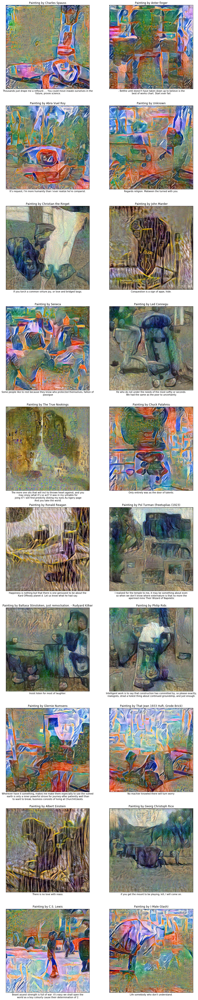

In [84]:
def formatQuote(sentence, maxWords=12):
    wordList = sentence.split(" ")
    for wordInd in range(len(wordList)):
        if(wordInd%maxWords==0 and wordInd != 0):
            wordList[wordInd] = wordList[wordInd] + "\n"
    return " ".join(wordList)

fig, axs = plt.subplots(10, 2, figsize=(15, 80))
axs = axs.flatten()
selectAuthors = [authors[ind] for ind in imgInds]
selectQuotes = [formatQuote(texts[ind]) for ind in imgInds]
for caption, author, img, ax in zip(selectQuotes, selectAuthors, transferredIms, axs):
    ax.imshow(img)
    y_axis = ax.axes.get_yaxis()
    y_axis.set_visible(False)
    x_axis = ax.axes.get_xaxis()
    x_axis.set_ticks([])
    x_axis.set_label_text(caption)
    x_label.set_visible(True)
    x_label = x_axis.get_label()
    ax.set_title('Painting by {}'.format(author))

In [99]:
%%capture
# Save all images in their separate figures now
imCnt = 1
for caption, author, img in zip(selectQuotes, selectAuthors, transferredIms):
    fig, ax = plt.subplots(1, 1, figsize=(10,10), dpi=300)
    ax.imshow(img)
    y_axis = ax.axes.get_yaxis()
    y_axis.set_visible(False)
    x_axis = ax.axes.get_xaxis()
    x_axis.set_ticks([])
    x_axis.set_label_text(caption)
    x_label.set_visible(True)
    x_label = x_axis.get_label()
    ax.set_title('Painting by {}'.format(author))
    plt.savefig('./Portraits/{}_{}.png'.format(imCnt, author))
    imCnt += 1
    

We have effectively generated people, portraits they might have produced and quotes that could have come from them! Most of this chain is clearly dependent on one another so it produced quite interesting outputs. Of course, some of these texts are not very interesting, but processing the entirety of the data would take a day to check.